# Models Notebook

This notebook will contain model iterations and feature experimention/engineering as well as continued EDA. This is a continuation of 02_mc_models notebook.

A few notes I need to keep in mind:
- We are focusing on correctly identifying the failing pumps, as this prevents people from accessing drinking water and is the most important to classify
- Because of this we will be using recall as primary metric. I may need to manually calculate as we are trying to minimize false negatives for specific class in a multiclass problem
- Other questions to explore:
    - Are there areas/regions that have more failing wells?
    - Does water quality appear to contribute to the likelihood of a well failing/needing repair?
    - How is the status of a well associated with the population using the well, if at all?
    - Is there a difference in rates of failure/repair between groundwater and surface water wells?
    - is there a difference in failure/repair with the type of pump?
    - Does the age of the well indicate liklihood of needed repair or failure?

Since we are trying to determine which pumps need to be taken care of, whether that be a pump that needs repairs or one that has failed and needs to be replaced, in this notebook I am going to group together the pumps that need repair and those that have failed into one category. So this will become a binary classification problem. This will also take care of the class imbalances that were causing trouble earlier. First I will import the libraries I need and get the basic dataframe.

In [1]:
# Standard imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Model selection
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV

# Preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, confusion_matrix, make_scorer

# Ensemble/XGBoost
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

#.py file
%load_ext autoreload
%autoreload 2
import os
import sys
module_path = os.path.abspath(os.path.join(os.pardir, os.pardir))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import src.mc_functions as mcf

In [2]:
# create base dataframe
df = mcf.create_base_df()

Now that the dataframe is imported, I can alter the status_group column. As it stands it has three categories, but I am going to group 'functional needs repair' and 'non functional' into one group. The column will now be 0's and 1's. 1 if the pump is functional and 0 otherwise.

In [3]:
binary_classes = [1 if sg == 'functional' else 0 for sg in df['status_group']]

In [4]:
df['status'] = binary_classes

In [5]:
df['status'].value_counts()

1    32259
0    27141
Name: status, dtype: int64

Great now those are grouped together and the classes are not imbalanced as it is before. Grouping these together seem to be more inline with our specific project narrative anyways. As we are trying to inform officials on which pumps they need to pay attention to, both failing pumps or semi-functional pumps that need repairs should be looked at.

## Train test split

Now I can perform train test split and begin modeling the new binary classification problem. Unfortunately, a few of the functions I have been using have now become obsolete, but I can edit those as needed

In [6]:
# target
y = df['status']
# features
X = df.drop(['status', 'status_group'], axis=1)

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=.2)

### NOTE
A quick note about how I am going to approach model iterations. The datasets from the train_test_split are not going to be touched. The function process_data in my .py file creates processed train and test dataframes given train and test data and numerical and categorical features to be included. So each feature iteration will have dataframe notation X_train1, X_test1. These dataframes can be used to test multiple models. Each model iteration will be tracked the same. logreg1, logreg2, rf1, rf2, etc.

Before moving on I want to compute an age column for X_train and X_test as it seemed to be a good indication of pump status. I will stick with the same way I have been doing it for now, calculating median construction year for each basin and using that to fill in missing years for the respective basin.

In [8]:
X_train['construction_year'] = X_train['construction_year'].replace(0, np.nan)

In [9]:
basins = X_train['basin'].unique()
med_year_basin = {}
for basin in basins:
    med_year = X_train[X_train['basin'] == basin].median()['construction_year']
    med_year_basin[basin] = med_year

In [10]:
X_train['construction_year'] = X_train['construction_year'].replace(np.nan, 0)

In [11]:
# fill in missing construction_year in X_train
for idx, row in X_train.iterrows():
    if row['construction_year'] == 0:
        X_train['construction_year'][idx] = med_year_basin[row['basin']]

# fill in missing construction_year in X_test
for idx, row in X_test.iterrows():
    if row['construction_year'] == 0:
        X_test['construction_year'][idx] = med_year_basin[row['basin']]

In [12]:
X_train['age'] = 2020 - X_train['construction_year']
X_test['age'] = 2020 - X_test['construction_year']

Now I can drop construction_year from both dataframes

In [13]:
X_train.drop('construction_year', axis=1, inplace=True)
X_test.drop('construction_year', axis=1, inplace=True)

Time to move onto modeling. Quickly, I want to check the effect of age on the two target classes.

In [14]:
df['construction_year'] = df['construction_year'].replace(0, np.nan)
df_med_year_basin = {}
for basin in basins:
    med_year = df[df['basin'] == basin].median()['construction_year']
    df_med_year_basin[basin] = med_year

df['construction_year'] = df['construction_year'].replace(np.nan)

# fill in missing construction_year in df
for idx, row in df.iterrows():
    if row['construction_year'] == 0:
        df['construction_year'][idx] = df_med_year_basin[row['basin']]

df['age'] = 2020 - df['construction_year']


In [15]:
df['construction_year'] = df['construction_year'].replace(0, np.nan)
df_mean_year_basin = {}
for basin in basins:
    mean_year = df[df['basin'] == basin].mean()['construction_year']
    df_mean_year_basin[basin] = mean_year

df['construction_year'] = df['construction_year'].replace(np.nan)

# fill in missing construction_year in df
for idx, row in df.iterrows():
    if row['construction_year'] == 0:
        df['construction_year'][idx] = df_mean_year_basin[row['basin']]

df['age_mean'] = 2020 - df['construction_year']

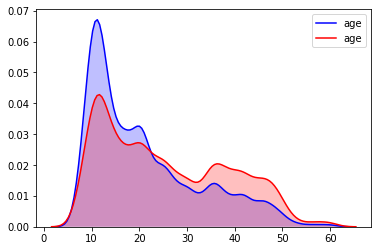

In [16]:
sns.kdeplot(df[df['status'] == 1]['age'], shade=True, color='blue')
sns.kdeplot(df[df['status'] == 0]['age'], shade=True, color='red')

I think it's pretty intuitive to believe that older pumps are more likely to be failing or in need of repairs. Even if the way i filled missing construction_year values wasn't 100% accurate, from the looks of the plot it should still help my model differentiate between the two.

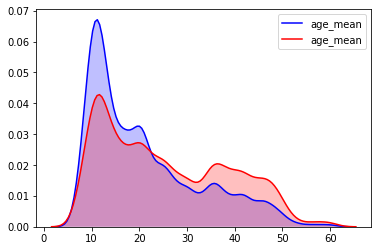

In [17]:
sns.kdeplot(df[df['status'] == 1]['age_mean'], shade=True, color='blue')
sns.kdeplot(df[df['status'] == 0]['age_mean'], shade=True, color='red')

I wanted to see if using the mean year for each basin had a greater affect than the median but the two plots are practically identical, so I will stick with median for now. If time permits I would like to try KNN to fill in the missing values.

In [18]:
X_train.columns

Index(['amount_tsh', 'gps_height', 'installer', 'basin', 'region',
       'population', 'extraction_type_group', 'management_group', 'payment',
       'water_quality', 'quantity', 'source_type', 'waterpoint_type_group',
       'age'],
      dtype='object')

## Modeling

For this first model I will use age and amount_tsh for numerical columns and region, management_group, source_type, and extraction_type_group as the categorical variables. I want to mess around with a few different models and hyperparameters. Since this is a binary classificaion now, I can use cross_val_score rather than KFold. I will still be using recall as main metric as we want to mitigate the number of false negatives (ie its better to falsely classify 1 than 0)

In [19]:
cat_vars1 = ['region', 'management_group', 'source_type', 'extraction_type_group']
num_vars1 = ['amount_tsh', 'age']
X_train1, X_test1 = mcf.process_data(X_train, X_test, cat_vars1, num_vars1)

In order to use recall with cross_val_score I need to instantiate a scorer object to give as argument.

In [20]:
scorer = make_scorer(recall_score)

Now I can begin working with some models. I want to start with a decision tree to see what features are used to split and get some more insight on the most important features

In [21]:
dt1 = DecisionTreeClassifier(criterion='entropy', random_state=42)
dt1.fit(X_train1, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

In [22]:
cross_val_score(dt1, X_train1, y_train, scoring=scorer, cv=5).mean()

0.759708269685131

In [23]:
dt1.feature_importances_

array([0.12210168, 0.27626423, 0.01068672, 0.00474199, 0.00559573,
       0.01613423, 0.00374857, 0.02345999, 0.01108155, 0.00834393,
       0.0087934 , 0.01330555, 0.00418581, 0.01144627, 0.01276467,
       0.00663046, 0.0146403 , 0.00774389, 0.00707617, 0.00795933,
       0.00868243, 0.00488959, 0.01466694, 0.01697013, 0.00687012,
       0.00866878, 0.00670092, 0.01569516, 0.0195228 , 0.00553659,
       0.00405713, 0.02596508, 0.02180335, 0.01058978, 0.02256327,
       0.00745555, 0.01715794, 0.00688725, 0.00094062, 0.01598104,
       0.01687384, 0.1298533 , 0.00347312, 0.00080611, 0.00311274,
       0.01898119, 0.0069532 , 0.00163759])

In order to visuaize the decision trees I need to import a few other libraries

/Users/mattcarr/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.184643 to fit



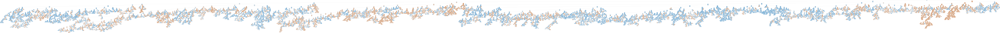

In [24]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dt1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, 
               feature_names=X_train1.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Well I should have seen that coming. Way too many splits to visualize.

In [25]:
xgb1 = XGBClassifier(random_state=42)

In [26]:
cross_val_score(xgb1, X_train1, y_train, scoring=scorer, cv=5).mean()

0.8484998250143819

In [27]:
cross_val_score(xgb1, X_test1, y_test, scoring=scorer, cv=5).mean()

0.832738679066555

That basic xgb classifier worked really well (surprise surprise) I still need to get a better idea of which features are the most important. 

In [28]:
feature_importances = pd.DataFrame(dt1.feature_importances_,
                                   index = X_train1.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

In [29]:
feature_importances

,importance
age,0.276264
x3_other,0.129853
amount_tsh,0.122102
x2_rainwater harvesting,0.025965
x0_Kigoma,0.023460
x2_spring,0.022563
x2_river/lake,0.021803
x2_borehole,0.019523
x3_submersible,0.018981
x3_gravity,0.017158


In [30]:
X_train['extraction_type_group'].value_counts()

gravity            21340
nira/tanira         6566
other               5150
submersible         4962
swn 80              2965
mono                2284
india mark ii       1920
afridev             1409
rope pump            376
other handpump       291
other motorpump      102
wind-powered          84
india mark iii        71
Name: extraction_type_group, dtype: int64

Age comes out to be the most important indicator. Knowing that, I may have to figure out a more accurate way to fill in those missing values, but I am going to leave it for now. extraction_type_group values are gathered at the bottom of feature_importance so I am going to remove that from the model and try waterpoint_type instead.

### Features 2

In [31]:
X_train.columns

Index(['amount_tsh', 'gps_height', 'installer', 'basin', 'region',
       'population', 'extraction_type_group', 'management_group', 'payment',
       'water_quality', 'quantity', 'source_type', 'waterpoint_type_group',
       'age'],
      dtype='object')

In [32]:
cat_vars2 = ['region', 'management_group', 'source_type', 'waterpoint_type_group']
num_vars2 = ['amount_tsh', 'age']
X_train2, X_test2 = mcf.process_data(X_train, X_test, cat_vars2, num_vars2)

In [33]:
cross_val_score(dt1, X_train2, y_train, scoring=scorer, cv=5).mean()

0.7783119370232017

Just by switching out extraction_type_group with waterpoint_type_group I was able to raise the recall score by about 2%. I want to try playing around with the hyperparameters of the decision tree model to see if I can raise this any more with the current features

In [34]:
dt2 = DecisionTreeClassifier(random_state=42, max_depth=10, min_samples_split=3)
dt2.fit(X_train2, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

In [35]:
cross_val_score(dt2, X_train2, y_train, scoring=scorer, cv=5).mean()

0.7862957046663333

Great that raised the recall score close to 2% again. I want to try these same hyperparameters with a RandomForestClassifer

In [36]:
rf1 = RandomForestClassifier(random_state=42, max_depth=10, min_samples_split=3)

In [37]:
cross_val_score(rf1, X_train2, y_train, scoring=scorer, cv=5).mean()

0.8392360713700999

In [38]:
feature_importances2 = pd.DataFrame(dt2.feature_importances_,
                                   index = X_train2.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

In [39]:
feature_importances2

,importance
x3_other,0.317609
age,0.225368
amount_tsh,0.138654
x2_borehole,0.046528
x0_Kigoma,0.032139
x0_Iringa,0.025801
x1_user-group,0.023021
x3_communal standpipe,0.020995
x1_commercial,0.020659
x0_Pwani,0.012394


The region's seem to be scatter around feature importance but a lot are focused on the bottom. I am going to try switching it out with basin and see how that helps. I am also going to add gps_height to numerical variables

### Features 3

In [40]:
cat_vars3 = ['basin', 'management_group', 'source_type', 'waterpoint_type_group']
num_vars3 = ['amount_tsh', 'age', 'gps_height']
X_train3, X_test3 = mcf.process_data(X_train, X_test, cat_vars3, num_vars3)

In [41]:
cross_val_score(dt2, X_train3, y_train, scoring=scorer, cv=5).mean()

0.7963315504326575

In [42]:
dt2.fit(X_train3, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

In [43]:
feature_importances3 = pd.DataFrame(dt2.feature_importances_,
                                   index = X_train3.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

In [44]:
feature_importances3

,importance
x3_other,0.289620
age,0.176933
gps_height,0.146599
amount_tsh,0.128185
x3_communal standpipe,0.033932
x0_Lake Tanganyika,0.033209
x2_borehole,0.030600
x0_Lake Victoria,0.022145
x1_commercial,0.019878
x0_Pangani,0.018347


gps_height has a greater impact than any of the basin categories, so I am going to remove basin altogether and just use gps_height as the location indicator. I am also going to add in payment to see how that helps.

### Features 4

In [45]:
cat_vars4 = ['management_group', 'source_type', 'waterpoint_type_group', 'payment']
num_vars4 = ['amount_tsh', 'age', 'gps_height']
X_train4, X_test4 = mcf.process_data(X_train, X_test, cat_vars4, num_vars4)

In [46]:
cross_val_score(dt2, X_train4, y_train, scoring=scorer, cv=5).mean()

0.8116424165138358

That brought the recall score up by about 2% once again. I want to see how the testing data will perform to ensure I am not overfitting the model.

In [47]:
cross_val_score(dt2, X_test4, y_test, scoring=scorer, cv=5).mean()

0.7365691990033406

The model is overfitting on the training data a little bit. But that can be addressed with some hyperparameter tuning.

In [48]:
X_train.columns

Index(['amount_tsh', 'gps_height', 'installer', 'basin', 'region',
       'population', 'extraction_type_group', 'management_group', 'payment',
       'water_quality', 'quantity', 'source_type', 'waterpoint_type_group',
       'age'],
      dtype='object')

In [49]:
dt2.fit(X_train4, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

In [50]:
feature_importances4 = pd.DataFrame(dt2.feature_importances_,
                                   index = X_train4.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

In [51]:
feature_importances4

,importance
x2_other,0.289361
age,0.194239
gps_height,0.150567
amount_tsh,0.141985
x1_borehole,0.038117
x2_communal standpipe,0.030632
x0_commercial,0.020447
x1_river/lake,0.020397
x3_unknown,0.019049
x1_spring,0.015030


Source type doesn't seem to be impacting the model too much so I am going to try taking it out. Once I check that I will put in water_quality and quantity to see how that impacts the model.

### Features 5

In [52]:
cat_vars5 = ['management_group', 'quantity', 'waterpoint_type_group', 'payment']
num_vars5 = ['amount_tsh', 'age', 'gps_height']
X_train5, X_test5 = mcf.process_data(X_train, X_test, cat_vars5, num_vars5)

In [53]:
cross_val_score(dt2, X_train5, y_train, scoring=scorer, cv=5).mean()

0.8750878082337868

Taking out source_type and putting in quantity raised the training recall score substantially. I am nervous the model may be extremely overfitting however, so I am going to check the testing data now.

In [54]:
cross_val_score(dt2, X_test5, y_test, scoring=scorer, cv=5).mean()

0.8418779212121066

Not really overfit at all! I am going to proceed with these features and try experimenting with some different models and hyperparameters now.

### Model experimentation with Features 5

First I am going to try using the RandomForestClassifier from earlier.

In [55]:
cross_val_score(rf1, X_train5, y_train, scoring=scorer, cv=5).mean()

0.8976046797012177

In [56]:
cross_val_score(rf1, X_test5, y_test, scoring=scorer, cv=5).mean()

0.8787362137973538

Now I want to try a default GradientBoostingClassifier

In [57]:
gbc1 = GradientBoostingClassifier(random_state=42)

In [58]:
cross_val_score(gbc1, X_train5, y_train, scoring=scorer, cv=5).mean()

0.8828771615980919

For a default model that is pretty good. I am going to increase the number of estimators

In [59]:
gbc2 = GradientBoostingClassifier(random_state=42, n_estimators=1000, max_depth=7)

In [60]:
cross_val_score(gbc2, X_train5, y_train, scoring=scorer, cv=5).mean()

0.8295868987591792

And after a 10 min run time the score was worse than before. How convenient

In [61]:
gbc2.fit(X_train5, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=7,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=1000,
                           n_iter_no_change=None, presort='auto',
                           random_state=42, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

I am going to continue experimenting with the RandomForestClassifier

In [62]:
rf2 = RandomForestClassifier(random_state=42, max_depth=7, criterion='entropy', 
                                max_features=.8)

In [63]:
cross_val_score(rf2, X_train5, y_train, scoring=scorer, cv=5).mean()

0.919773652723392

In [64]:
cross_val_score(rf2, X_test5, y_test, scoring=scorer, cv=5).mean()

0.9097121534414248

RandomForest seems to performing the best so far so I am going to continue experimenting with that.

In [65]:
rf3 = RandomForestClassifier(random_state=42, max_depth=2, criterion='entropy',
                                max_features=.75)

In [66]:
cross_val_score(rf3, X_train5, y_train, scoring=scorer, cv=5).mean()

0.9691109754284144

In [67]:
cross_val_score(rf3, X_test5, y_test, scoring=scorer, cv=5).mean()

0.97026472866451

Turns out we aren't doing a binary problem anymore. So back to predicting ternary.